In [1]:
import os

os.chdir('D:/GNN/overlapping-community-detection-master/')#更改路径，''里面为更改的路径

import nocd
import matplotlib.pyplot as plt
import numpy as np
import scipy.sparse as sp
import torch
import torch.nn as nn
import torch.nn.functional as F

from sklearn.preprocessing import normalize



%matplotlib inline

torch.set_default_tensor_type(torch.cuda.FloatTensor)

# Defining and training the model

Load the dataset
 - `A` (adjacency matrix) is a `scipy.sparse.csr_matrix` of size `[N, N]`
 - `X` (attribute matrix) is a `scipy.sparse.csr_matrix` of size `[N, D]`
 - `Z_gt` (binary community affiliation matrix) is a `np.ndarray` of size `[N, K]`

In [2]:
#loader = nocd.data.load_dataset('data/mag_cs.npz')
loader=nocd.data.load_dataset('data/facebook_ego/fb_414.npz')
A, X, Z_gt = loader['A'], loader['X'], loader['Z']
N, K = Z_gt.shape

Define the hyperparameters

In [3]:
hidden_sizes = [128]    # hidden sizes of the GNN
weight_decay = 1e-2     # strength of L2 regularization on GNN weights
dropout = 0.5           # whether to use dropout
batch_norm = True       # whether to use batch norm
lr = 1e-3               # learning rate
max_epochs = 500        # number of epochs to train
display_step = 25       # how often to compute validation loss
balance_loss = True     # whether to use balanced loss
stochastic_loss = True  # whether to use stochastic or full-batch training
batch_size = 20000      # batch size (only for stochastic training)

Select & normalize the feature matrix

For some datasets where the features are very informative / correlated with the community structure it's better to use `X` as input (e.g. co-authorship networks w/ keywords as node features). Otherwise, you should try using `A` or `[A, X]` as input.

In [4]:
x_norm = normalize(X)  # node features
# x_norm = normalize(A)  # adjacency matrix
# x_norm = sp.hstack([normalize(X), normalize(A)])  # concatenate A and X
x_norm = nocd.utils.to_sparse_tensor(x_norm).cuda()

In [ ]:
x_norm

Define the GNN model

In [5]:
sampler = nocd.sampler.get_edge_sampler(A, batch_size, batch_size, num_workers=5)
gnn = nocd.nn.GCN(x_norm.shape[1], hidden_sizes, K, batch_norm=batch_norm, dropout=dropout).cuda()
adj_norm = gnn.normalize_adj(A)
decoder = nocd.nn.BerpoDecoder(N, A.nnz, balance_loss=balance_loss)
opt = torch.optim.Adam(gnn.parameters(), lr=lr)

In [6]:
def get_nmi(thresh=0.5):
    """Compute Overlapping NMI of the communities predicted by the GNN."""
    gnn.eval()
    Z = F.relu(gnn(x_norm, adj_norm))
    Z_pred = Z.cpu().detach().numpy() > thresh
    nmi = nocd.metrics.overlapping_nmi(Z_pred, Z_gt)
    
    #nmi = nocd.metrics.evaluate_unsupervised(Z_pred, A)

    return nmi

In [7]:
val_loss = np.inf
validation_fn = lambda: val_loss
early_stopping = nocd.train.NoImprovementStopping(validation_fn, patience=10)
model_saver = nocd.train.ModelSaver(gnn)
for epoch, batch in enumerate(sampler):
    if epoch > 2:
        break

In [22]:
from scipy import sparse


A = sparse.load_npz('A.npz')
X=sparse.load_npz('X.npz')
x_norm = normalize(X)  # node features
# x_norm = normalize(A)  # adjacency matrix
# x_norm = sp.hstack([normalize(X), normalize(A)])  # concatenate A and X
x_norm = nocd.utils.to_sparse_tensor(x_norm).cuda()

adj_norm = gnn.normalize_adj(A)


In [21]:
sampler = nocd.sampler.get_edge_sampler(A, batch_size, batch_size, num_workers=5)
gnn = nocd.nn.GCN(x_norm.shape[1], hidden_sizes, K, batch_norm=batch_norm, dropout=dropout).cuda()
adj_norm = gnn.normalize_adj(A)
decoder = nocd.nn.BerpoDecoder(N, A.nnz, balance_loss=balance_loss)
opt = torch.optim.Adam(gnn.parameters(), lr=lr)

In [97]:
N=X.shape[0]
K=10


In [63]:
val_loss = np.inf
validation_fn = lambda: val_loss
early_stopping = nocd.train.NoImprovementStopping(validation_fn, patience=10)
model_saver = nocd.train.ModelSaver(gnn)
for epoch, batch in enumerate(sampler):
    if epoch > 2:
        break

In [49]:
gnn.train()


GCN(
  (layers): ModuleList(
    (0): GraphConvolution()
    (1): GraphConvolution()
  )
)

Training loop

In [98]:
val_loss = np.inf
validation_fn = lambda: val_loss
early_stopping = nocd.train.NoImprovementStopping(validation_fn, patience=10)
model_saver = nocd.train.ModelSaver(gnn)

for epoch, batch in enumerate(sampler):
    if epoch > max_epochs:
        break
    if epoch % 2 == 0:
        with torch.no_grad():
            gnn.eval()
            # Compute validation loss
            Z = F.relu(gnn(x_norm, adj_norm))
            val_loss = decoder.loss_full(Z, A)
         #   print(f'Epoch {epoch:4d}, loss.full = {val_loss:.4f}, nmi = {get_nmi():.2f}')
            
            # Check if it's time for early stopping / to save the model
            early_stopping.next_step()
            if early_stopping.should_save():
                model_saver.save()
            if early_stopping.should_stop():
                print(f'Breaking due to early stopping at epoch {epoch}')
                break
            
    # Training step
    gnn.train()
    opt.zero_grad()
    Z = F.relu(gnn(x_norm, adj_norm))
    ones_idx, zeros_idx = batch
    if stochastic_loss:
        loss = decoder.loss_batch(Z, ones_idx, zeros_idx)
    else:
        loss = decoder.loss_full(Z, A)
    loss += nocd.utils.l2_reg_loss(gnn, scale=weight_decay)
    loss.backward()
    opt.step()

Breaking due to early stopping at epoch 40


Depending on whether you use balanced loss or not, you should (probably) use different threshold values. From my experience, following are reasonable defaults:
 - for `balance_loss = True`: `thresh = 0.5`
 - for `balance_loss = False`: `thresh = 0.01`
 
You can look at the distribution of the non-zero entries of `Z` to decide on a good value for the threshold. 
I guess it makes sense to select a value that lies in the leftmost "valley" of histogram below. 
You can also look at the unsupervised metrics in the next section of this notebook to make an informed choice.

Note that all of these are just speculations based on the behavior that I observed for a handful of datasets, YMMV.

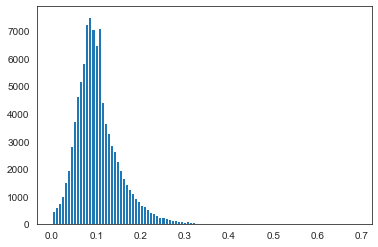

In [99]:
plt.hist(Z[Z > 0].cpu().detach().numpy(), 100);

In [110]:
thresh = 0.2

Z = F.relu(gnn(x_norm, adj_norm))
Z_pred = Z.cpu().detach().numpy() > thresh
model_saver.restore()
#print(f'Final nmi = {get_nmi(thresh):.3f}')

# Analyzing the results

### Visualize the adjacency matrix sorted by the communities

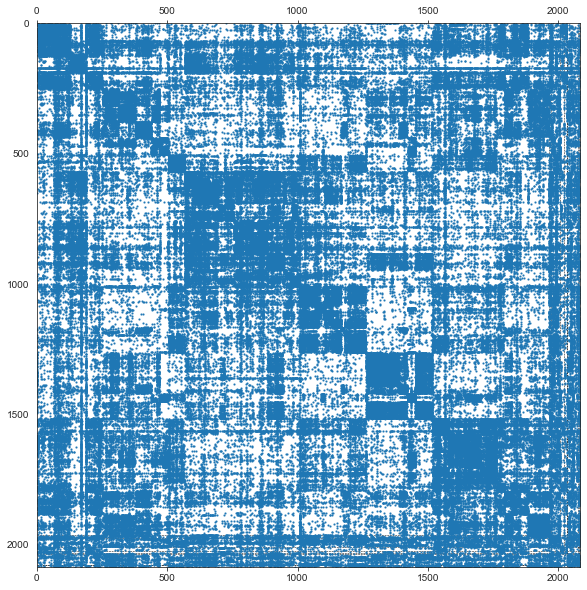

In [111]:
plt.figure(figsize=[10, 10])
z = np.argmax(Z_pred, 1)
o = np.argsort(z)
nocd.utils.plot_sparse_clustered_adjacency(A, K, z, o, markersize=1)

In [112]:
metrics = nocd.metrics.evaluate_unsupervised(Z_pred, A)
print(f"Predicted communities:\n"
      f" - coverage    = {metrics['coverage']:.4f}\n"
      f" - conductance = {metrics['conductance']:.4f}\n"
      f" - density     = {metrics['density']:.3e}\n"
      f" - clust_coef  = {metrics['clustering_coef']:.3e}")

Predicted communities:
 - coverage    = 0.2056
 - conductance = 0.7129
 - density     = 3.014e-01
 - clust_coef  = 4.932e+03


In [103]:
# Sizes of detected communities
print(Z_pred.sum(0))

[ 62   0  10 190 208 123   4   0 403 331   0  66  16   0 329  33  18  12
 292 198  12 265  12  26   0  29 283   0   0  25 268  15   0  67   0   0
   0 361 115  18  14 160 216  30 151   0 349 100 272   0]


In [36]:
np.savetxt('Z_pred.csv',Z_pred)

In [125]:
type(Z_pred)

numpy.ndarray

In [122]:
print(X)

  (0, 0)	1
  (1, 0)	1
  (2, 0)	1
  (3, 0)	1
  (4, 0)	1
  (5, 0)	1
  (6, 0)	1
  (7, 0)	1
  (8, 0)	1
  (9, 0)	1
  (10, 0)	1
  (11, 0)	1
  (12, 0)	1
  (13, 0)	1
  (14, 0)	1
  (15, 0)	1
  (16, 0)	1
  (17, 0)	1
  (18, 0)	1
  (19, 0)	1
  (20, 0)	1
  (21, 0)	1
  (22, 0)	1
  (23, 0)	1
  (24, 0)	1
  :	:
  (2060, 0)	1
  (2061, 0)	1
  (2062, 0)	1
  (2063, 0)	1
  (2064, 0)	1
  (2065, 0)	1
  (2066, 0)	1
  (2067, 0)	1
  (2068, 0)	1
  (2069, 0)	1
  (2070, 0)	1
  (2071, 0)	1
  (2072, 0)	1
  (2073, 0)	1
  (2074, 0)	1
  (2075, 0)	1
  (2076, 0)	1
  (2077, 0)	1
  (2078, 0)	1
  (2079, 0)	1
  (2080, 0)	1
  (2081, 0)	1
  (2082, 0)	1
  (2083, 0)	1
  (2084, 0)	1


In [ ]:
A

### Quantify quality of the communities based on unsupervised metrics.

Metrics:
* **Coverage**: what percentage of the edges is explained by at least one community? (i.e. if $(u, v)$ is an edge, both nodes share at least one community) Higher is better.
$$\textrm{Coverage}(C_1, ..., C_K) = \frac{1}{|E|}\sum_{u, v \in E} \mathbb{1}[z_u^T z_v > 0]$$


* **Density**: average density of the detected communities (weighted by community size). Higher is better.

$$\rho(C) = \frac{\text{# existing edges in $C$}}{\text{# of possible edges in $C$}}$$

$$\textrm{AvgDensity}(C_1, ..., C_K) = \frac{1}{\sum_i |C_i|}\sum_i \rho(C_i) \cdot |C_i|$$


* **Conductance**: average conductance of the detected communities (weighted by community size). Lower is better.

$$\textrm{outside}(C) = \sum_{u \in C, v \notin C} A_{uv}$$

$$\textrm{inside}(C) = \sum_{u \in C, v \in C, v \ne u} A_{uv}$$

$$\textrm{Conductance}(C) = \frac{\textrm{outside}(C)}{\textrm{inside}(C) + \textrm{outside}(C)}$$

$$\textrm{AvgConductance}(C_1, ..., C_K) = \frac{1}{\sum_i |C_i|}\sum_i \textrm{Conductance}(C_i) \cdot |C_i|$$


* **Clustering coefficient**: average clustering coefficient of the detected communities (weighted by community size). Higher is better.

$$\textrm{ClustCoef}(C) = \frac{\text{# existing triangles in $C$}}{\text{# of possible triangles in $C$}}$$

$$\textrm{AvgClustCoef}(C_1, ..., C_K) = \frac{1}{\sum_i |C_i|}\sum_i \textrm{ClustCoef}(C_i) \cdot |C_i|$$

Clustering coefficient & density of the entire graph

In [35]:
density_baseline = A.nnz / (N**2 - N)
num_triangles = (A @ A @ A).diagonal().sum() / 6
num_possible_triangles = (N - 2) * (N - 1) * N / 6
clust_coef_baseline = num_triangles / num_possible_triangles
print(f'Background (over the entire graph):\n'
      f' - density    = {density_baseline:.3e}\n'
      f' - clust_coef = {clust_coef_baseline:.3e}')

Background (over the entire graph):
 - density    = 5.983e-02
 - clust_coef = -2.329e-01


In [36]:
metrics = nocd.metrics.evaluate_unsupervised(Z_gt, A)
print(f"Ground truth communities:\n"
      f" - coverage    = {metrics['coverage']:.4f}\n"
      f" - conductance = {metrics['conductance']:.4f}\n"
      f" - density     = {metrics['density']:.3e}\n"
      f" - clust_coef  = {metrics['clustering_coef']:.3e}")

IndexError: index 159 is out of bounds for axis 0 with size 159

In [59]:
metrics = nocd.metrics.evaluate_unsupervised(Z_pred, A)
print(f"Predicted communities:\n"
      f" - coverage    = {metrics['coverage']:.4f}\n"
      f" - conductance = {metrics['conductance']:.4f}\n"
      f" - density     = {metrics['density']:.3e}\n"
      f" - clust_coef  = {metrics['clustering_coef']:.3e}")

Predicted communities:
 - coverage    = 0.8693
 - conductance = 0.2709
 - density     = 1.143e-01
 - clust_coef  = 5.471e+01


visulize the community

The detected partition has lower conductance / higher density / higher clustering coefficient than the GT communities.

NameError: name 'user1' is not defined

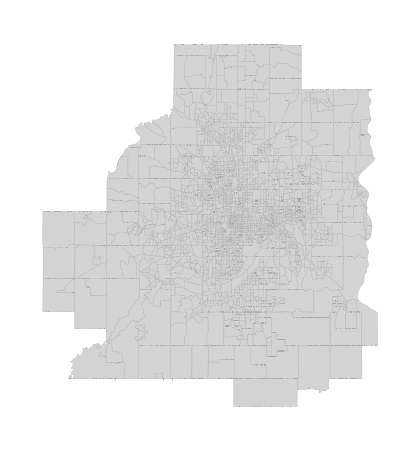

In [113]:
import os
import geopandas as gpd
import geoplot
import geoplot.crs as gcrs

cbg_path='D:\\GNN\\sample_data_mn_20200301-20220424T172614Z-001\\sample_data_mn_20200301\\'

cbg = gpd.read_file(cbg_path+"geo/cbg_TCMA.geojson")


geoplot.polyplot(cbg, projection=gcrs.AlbersEqualArea(), edgecolor='darkgrey', facecolor='lightgrey', linewidth=.3,
    figsize=(12, 8))


In [161]:
cbg

,StateFIPS,CountyFIPS,TractCode,BlockGroup,CensusBlockGroup,State,County,ClassCode,geometry
0,27,019,091100,1,270190911001,MN,Carver County,H1,"MULTIPOLYGON (((-93.76804 44.64280, -93.76804 ..."
1,27,019,091201,1,270190912011,MN,Carver County,H1,"MULTIPOLYGON (((-94.01048 44.71880, -94.01047 ..."
2,27,019,090800,2,270190908002,MN,Carver County,H1,"MULTIPOLYGON (((-93.61734 44.83011, -93.61261 ..."
3,27,019,090100,2,270190901002,MN,Carver County,H1,"MULTIPOLYGON (((-93.88993 44.97638, -93.88990 ..."
4,27,019,090302,1,270190903021,MN,Carver County,H1,"MULTIPOLYGON (((-93.88203 44.80464, -93.87963 ..."
...,...,...,...,...,...,...,...,...,...
2080,27,053,006800,2,270530068002,MN,Hennepin County,H1,"MULTIPOLYGON (((-93.28803 44.95733, -93.28802 ..."
2081,27,053,026807,3,270530268073,MN,Hennepin County,H1,"MULTIPOLYGON (((-93.39212 45.07971, -93.39195 ..."
2082,27,053,022102,2,270530221022,MN,Hennepin County,H1,"MULTIPOLYGON (((-93.38369 44.95686, -93.38120 ..."
2083,27,053,100700,4,270531007004,MN,Hennepin County,H1,"MULTIPOLYGON (((-93.31335 45.01867, -93.31208 ..."


In [173]:
import pandas as pd

cbg['CensusBlockGroup'].apply(int)
uniqueID=cbg['CensusBlockGroup'].unique()
uniqueID.sort()
#uniqueID.shape
key=range(0,2085)
dic_id = dict(zip(key, uniqueID))

In [175]:
dic_id_new = dict([(value, key) for (key, value) in dic_id.items()])


In [176]:
#dic_id_new = dict([(value, key) for (key, value) in dic_id.items()])

cbg['O_id']=cbg.CensusBlockGroup.map(dic_id_new)

In [177]:
cbg

,StateFIPS,CountyFIPS,TractCode,BlockGroup,CensusBlockGroup,State,County,ClassCode,geometry,O_id
0,27,019,091100,1,270190911001,MN,Carver County,H1,"MULTIPOLYGON (((-93.76804 44.64280, -93.76804 ...",275
1,27,019,091201,1,270190912011,MN,Carver County,H1,"MULTIPOLYGON (((-94.01048 44.71880, -94.01047 ...",277
2,27,019,090800,2,270190908002,MN,Carver County,H1,"MULTIPOLYGON (((-93.61734 44.83011, -93.61261 ...",263
3,27,019,090100,2,270190901002,MN,Carver County,H1,"MULTIPOLYGON (((-93.88993 44.97638, -93.88990 ...",236
4,27,019,090302,1,270190903021,MN,Carver County,H1,"MULTIPOLYGON (((-93.88203 44.80464, -93.87963 ...",244
...,...,...,...,...,...,...,...,...,...,...
2080,27,053,006800,2,270530068002,MN,Hennepin County,H1,"MULTIPOLYGON (((-93.28803 44.95733, -93.28802 ...",556
2081,27,053,026807,3,270530268073,MN,Hennepin County,H1,"MULTIPOLYGON (((-93.39212 45.07971, -93.39195 ...",1095
2082,27,053,022102,2,270530221022,MN,Hennepin County,H1,"MULTIPOLYGON (((-93.38369 44.95686, -93.38120 ...",741
2083,27,053,100700,4,270531007004,MN,Hennepin County,H1,"MULTIPOLYGON (((-93.31335 45.01867, -93.31208 ...",1231


In [132]:
Z_result=Z_pred.copy()

In [133]:
Z_result=Z_result+0

In [139]:
Z_result_pd=pd.DataFrame(Z_result)

In [191]:
Z_result_pd.index

RangeIndex(start=0, stop=2085, step=1)

In [181]:
cbg.sort_values('O_id',inplace=True)

In [182]:
cbg

,StateFIPS,CountyFIPS,TractCode,BlockGroup,CensusBlockGroup,State,County,ClassCode,geometry,O_id
1807,27,003,050107,1,270030501071,MN,Anoka County,H1,"MULTIPOLYGON (((-93.51007 45.41480, -93.50056 ...",0
1834,27,003,050108,1,270030501081,MN,Anoka County,H1,"MULTIPOLYGON (((-93.35241 45.38921, -93.35240 ...",1
1270,27,003,050108,2,270030501082,MN,Anoka County,H1,"MULTIPOLYGON (((-93.37813 45.38112, -93.37778 ...",2
1271,27,003,050109,1,270030501091,MN,Anoka County,H1,"MULTIPOLYGON (((-93.26550 45.37326, -93.26550 ...",3
1283,27,003,050109,2,270030501092,MN,Anoka County,H1,"MULTIPOLYGON (((-93.23550 45.41380, -93.23533 ...",4
...,...,...,...,...,...,...,...,...,...,...
127,27,163,071400,1,271630714001,MN,Washington County,H1,"MULTIPOLYGON (((-92.98395 44.84705, -92.98395 ...",2080
1198,27,163,071400,2,271630714002,MN,Washington County,H1,"MULTIPOLYGON (((-92.97339 44.82688, -92.97337 ...",2081
242,27,163,071400,3,271630714003,MN,Washington County,H1,"MULTIPOLYGON (((-93.02150 44.78724, -93.02147 ...",2082
1197,27,163,071400,4,271630714004,MN,Washington County,H1,"MULTIPOLYGON (((-92.96468 44.80631, -92.96466 ...",2083


In [185]:
result=pd.concat([cbg,Z_result_pd],axis=1)

In [197]:
result.to_csv('result.csv')

In [198]:
result.columns

Index([       'StateFIPS',       'CountyFIPS',        'TractCode',
             'BlockGroup', 'CensusBlockGroup',            'State',
                 'County',        'ClassCode',         'geometry',
                   'O_id',                  0,                  1,
                        2,                  3,                  4,
                        5,                  6,                  7,
                        8,                  9,                 10,
                       11,                 12,                 13,
                       14,                 15,                 16,
                       17,                 18,                 19,
                       20,                 21,                 22,
                       23,                 24,                 25,
                       26,                 27,                 28,
                       29,                 30,                 31,
                       32,                 33,                

In [ ]:
import contextily # for visualization of base map

f,ax=plt.subplots(1,1,figsize=(10,10))
result.to_crs(cbg_all.crs).plot('price_log',cmap='BuPu',legend=True,ax=ax)
contextily.add_basemap(ax=ax,crs=cbg_all.crs,
                       source=contextily.providers.Stamen.TonerLite)

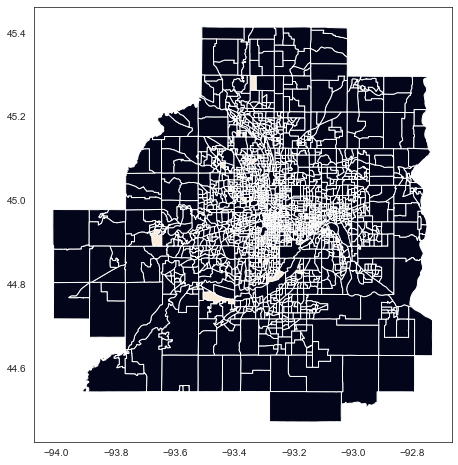

In [213]:
result.plot(25, figsize=(12, 8))

D:\Anaconda\lib\site-packages\geopandas\plotting.py:661: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)
D:\Anaconda\lib\site-packages\geopandas\plotting.py:661: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)
D:\Anaconda\lib\site-packages\geopandas\plotting.py:661: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To cont

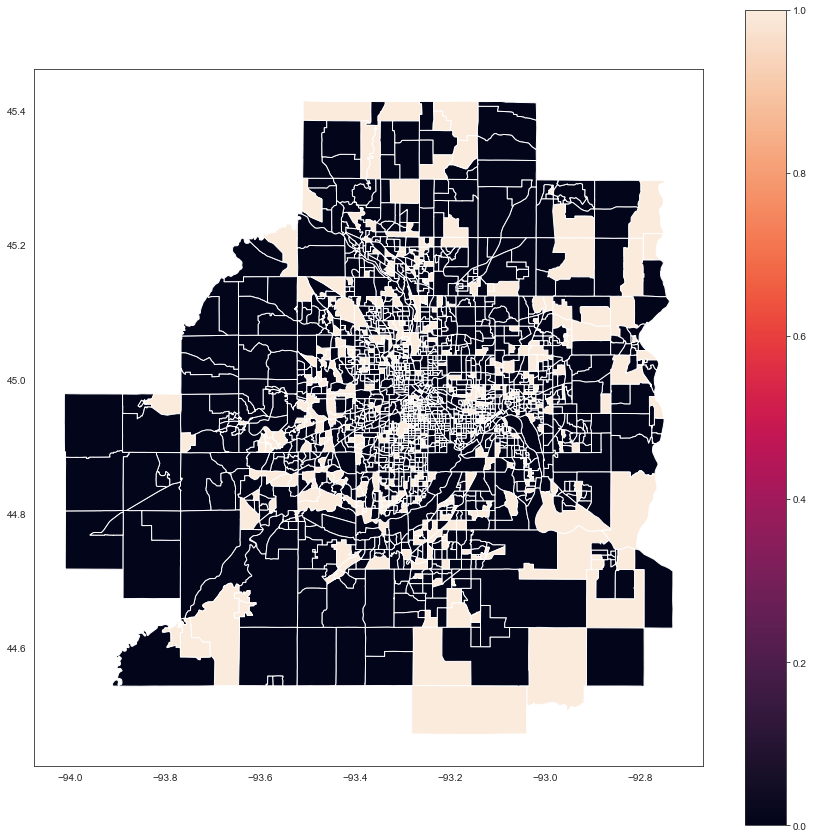

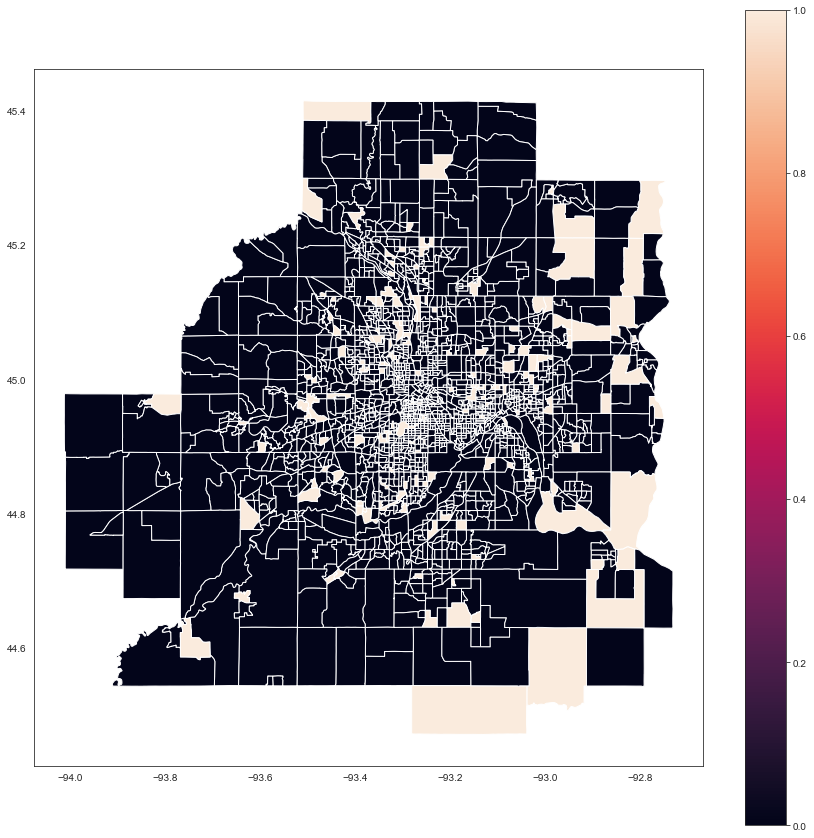

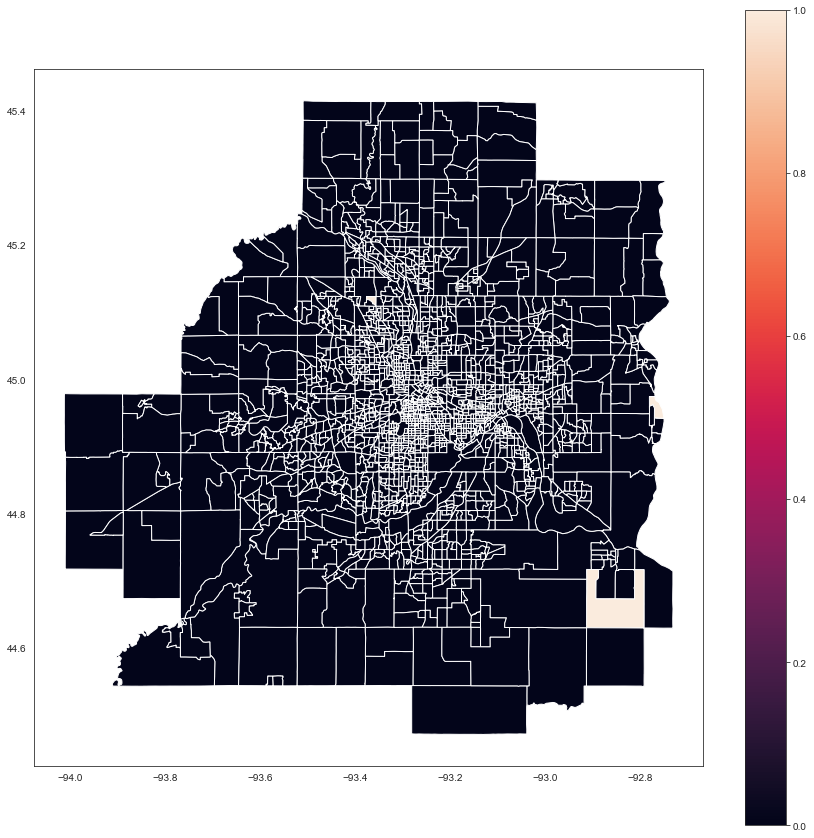

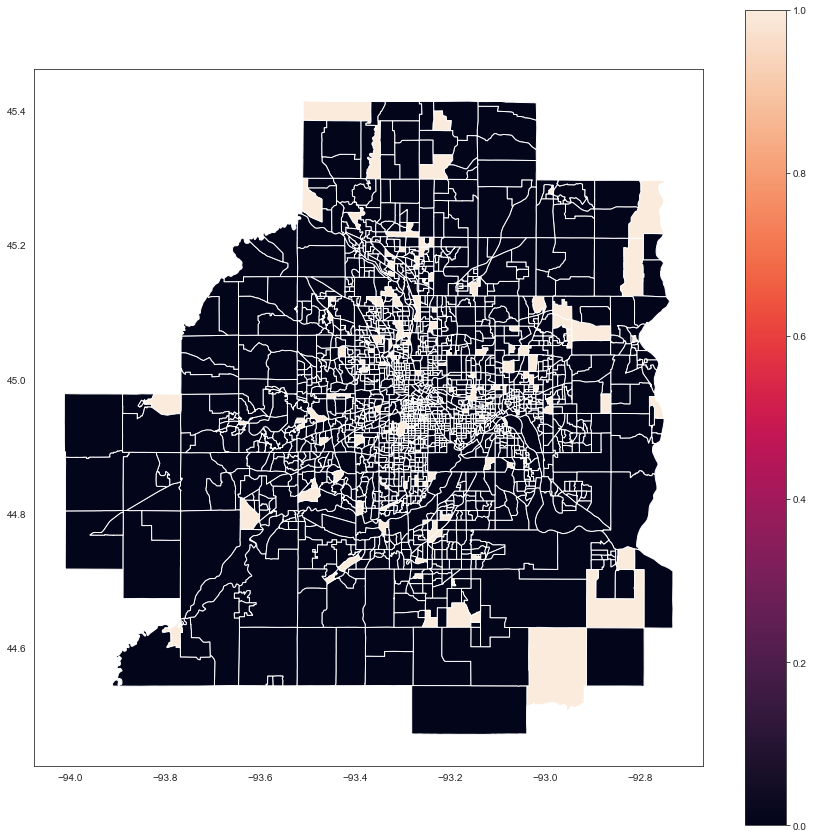

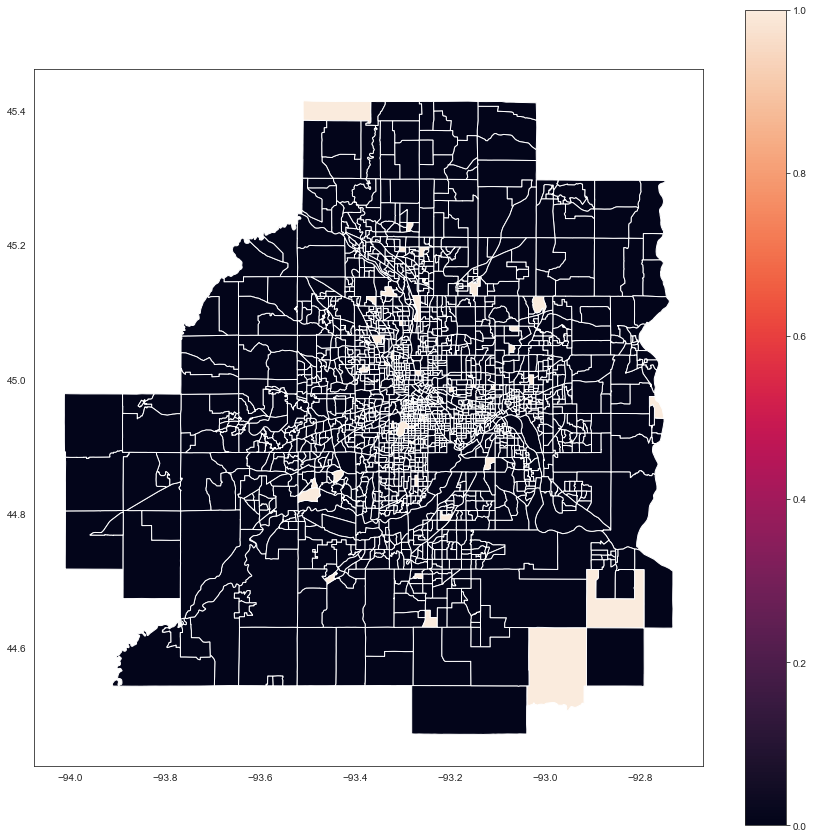

...

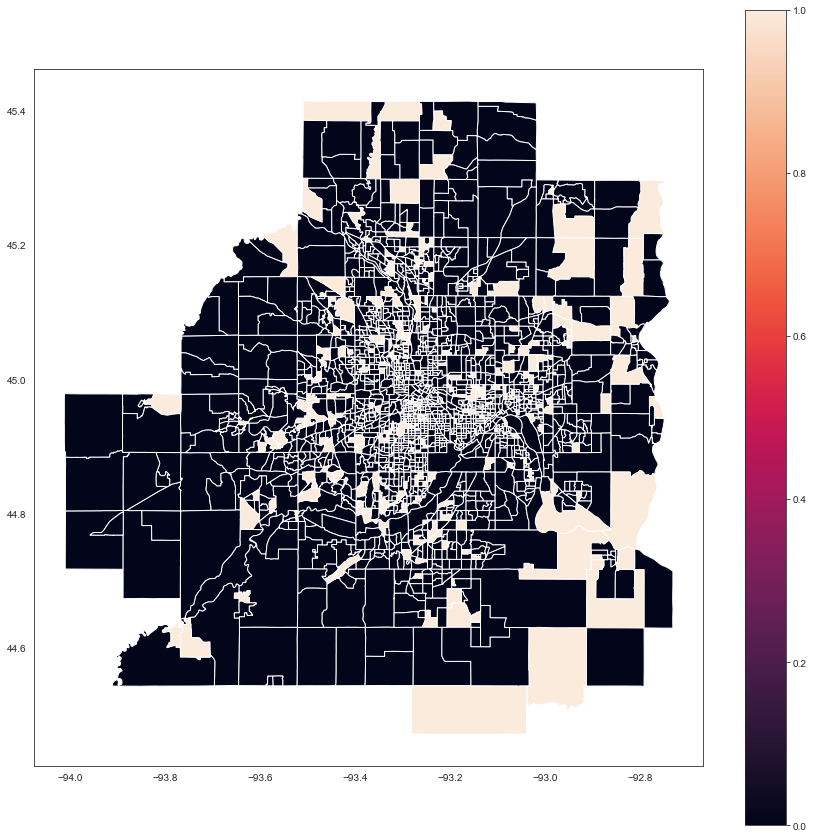

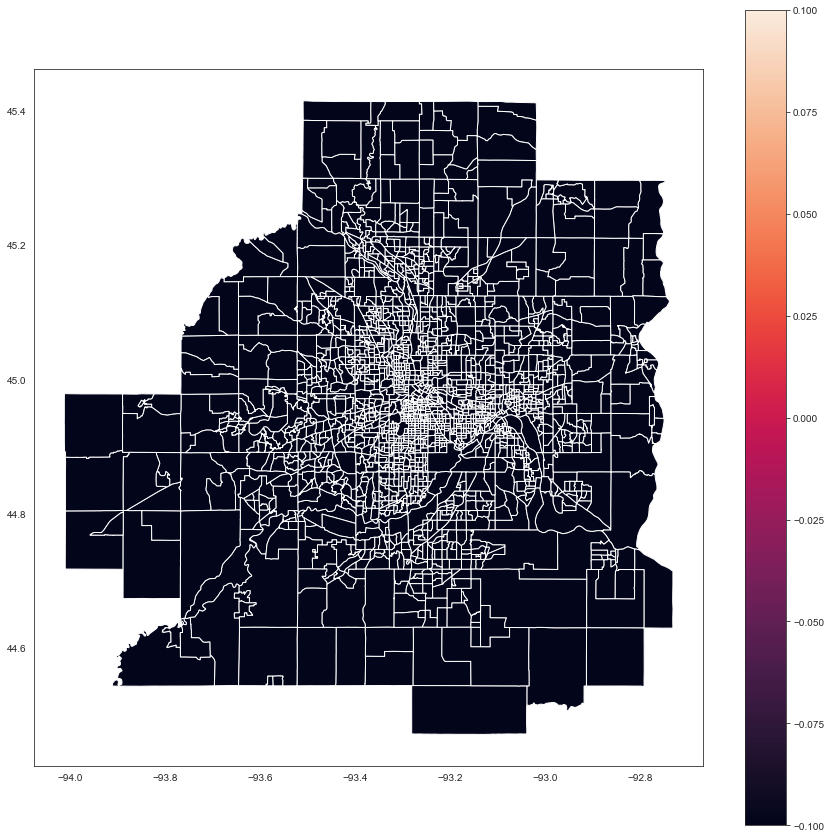

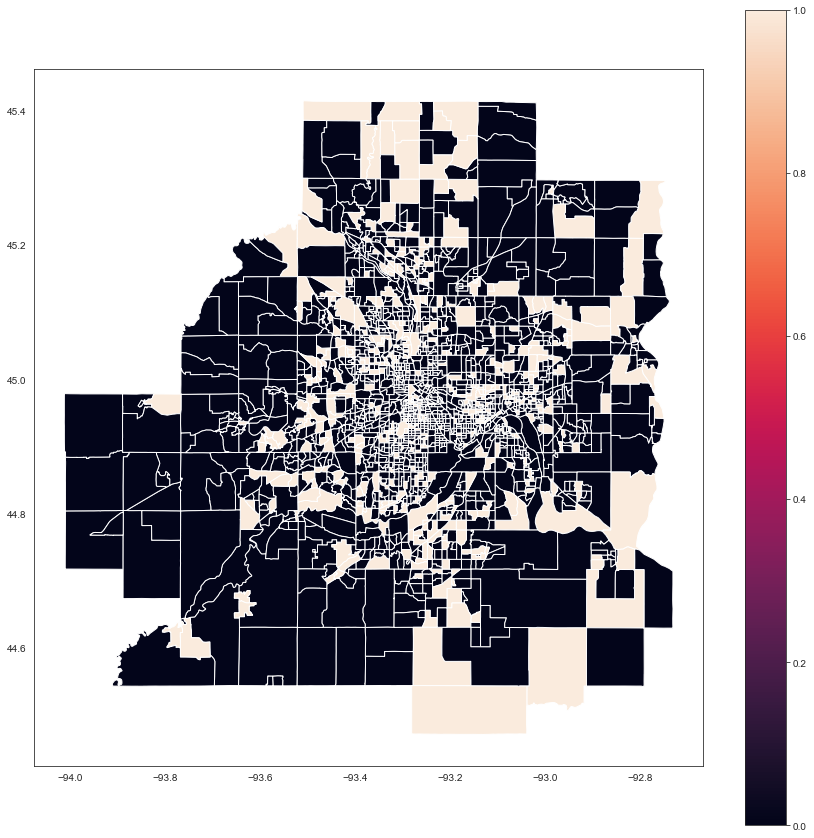

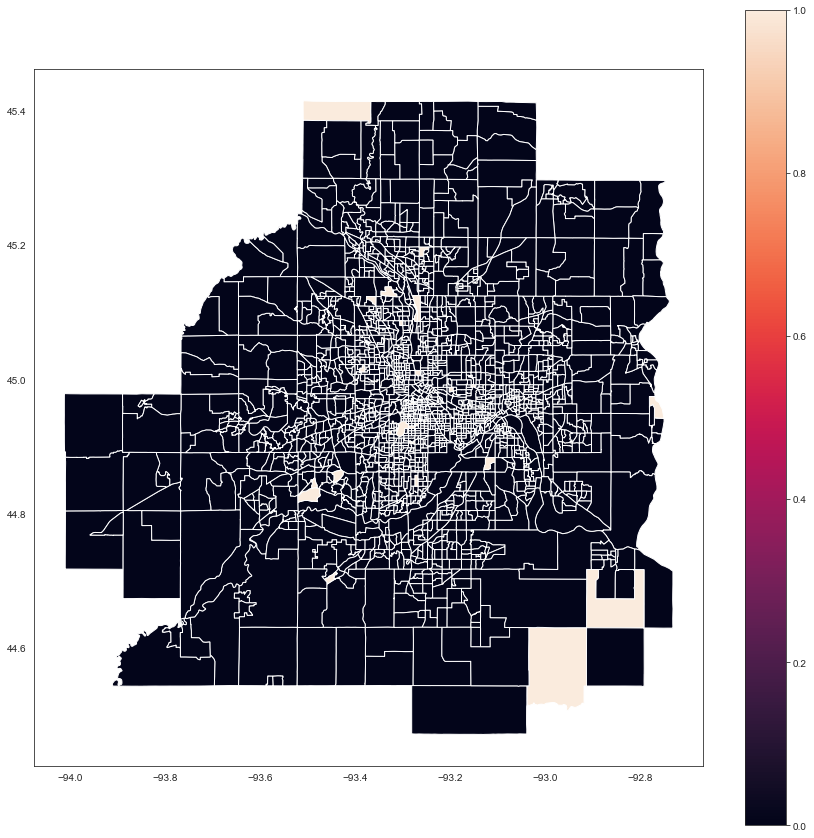

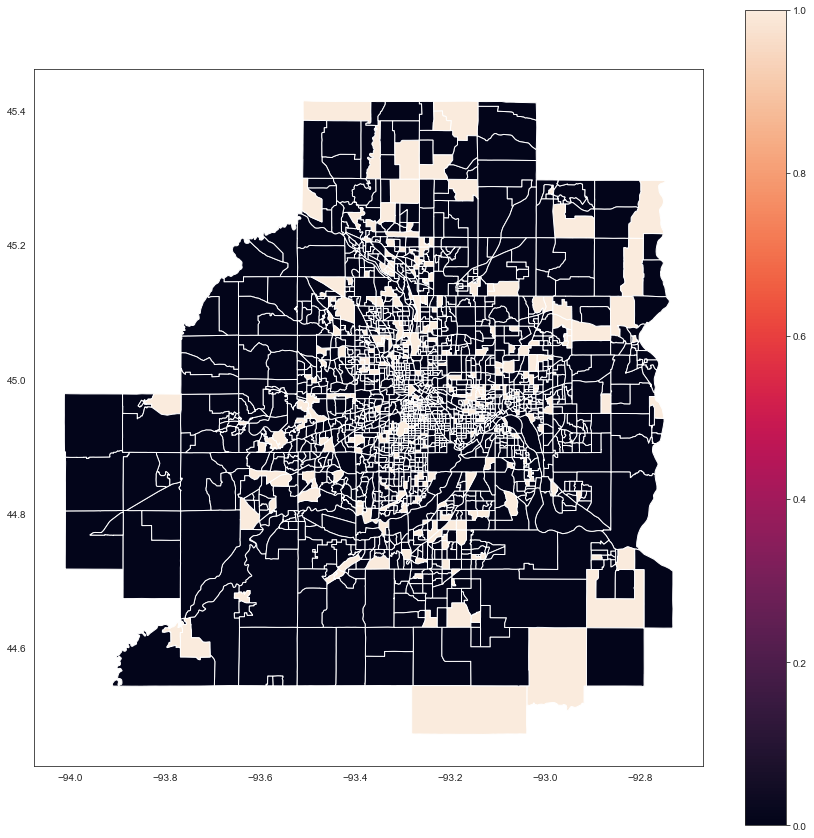

In [231]:
for i in range(49):
    
    result.plot(i, figsize=(15, 15),legend=True)


In [217]:
result['overlap_count']=result.iloc[:,10:60].sum(axis=1)

In [218]:
result

,StateFIPS,CountyFIPS,TractCode,BlockGroup,CensusBlockGroup,State,County,ClassCode,geometry,O_id,...,41,42,43,44,45,46,47,48,49,overlap_count
0,27,019,091100,1,270190911001,MN,Carver County,H1,"MULTIPOLYGON (((-93.76804 44.64280, -93.76804 ...",275,...,0,0,0,0,0,0,0,0,0,0
1,27,019,091201,1,270190912011,MN,Carver County,H1,"MULTIPOLYGON (((-94.01048 44.71880, -94.01047 ...",277,...,1,0,0,0,0,0,0,0,0,3
2,27,019,090800,2,270190908002,MN,Carver County,H1,"MULTIPOLYGON (((-93.61734 44.83011, -93.61261 ...",263,...,1,0,0,1,0,0,0,0,0,5
3,27,019,090100,2,270190901002,MN,Carver County,H1,"MULTIPOLYGON (((-93.88993 44.97638, -93.88990 ...",236,...,0,0,0,0,0,0,0,0,0,0
4,27,019,090302,1,270190903021,MN,Carver County,H1,"MULTIPOLYGON (((-93.88203 44.80464, -93.87963 ...",244,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2080,27,053,006800,2,270530068002,MN,Hennepin County,H1,"MULTIPOLYGON (((-93.28803 44.95733, -93.28802 ...",556,...,0,0,0,0,0,0,0,0,0,0
2081,27,053,026807,3,270530268073,MN,Hennepin County,H1,"MULTIPOLYGON (((-93.39212 45.07971, -93.39195 ...",1095,...,0,0,0,0,0,0,0,0,0,0
2082,27,053,022102,2,270530221022,MN,Hennepin County,H1,"MULTIPOLYGON (((-93.38369 44.95686, -93.38120 ...",741,...,0,0,0,0,0,0,0,0,0,0
2083,27,053,100700,4,270531007004,MN,Hennepin County,H1,"MULTIPOLYGON (((-93.31335 45.01867, -93.31208 ...",1231,...,0,0,0,0,0,0,0,0,0,0


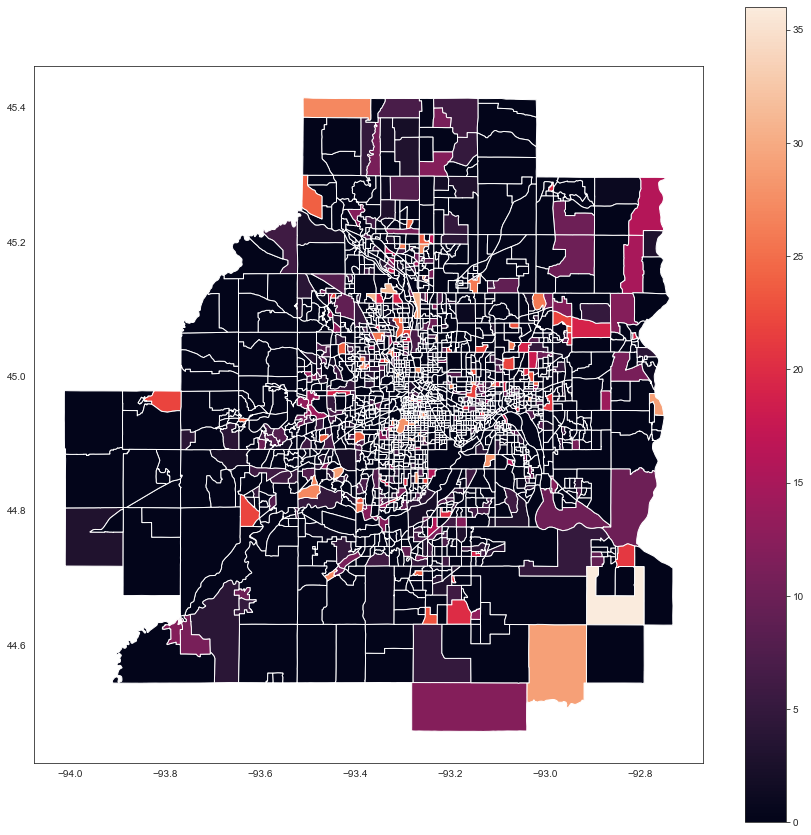

In [226]:
result.plot('overlap_count', figsize=(15, 15),legend=True)
